<h4 align="right">27th of April 2020</h4>
<h1 align="center">Neural Networks and Deep Learning (CIE 555)</h1>
<h2 align="center">Lab 10: Generative Adversarial Networks (GAN)</h2> <br>

This notebook material is imported from Udacity's deep learning nanodegree repo: https://github.com/udacity/deep-learning

The notebook is built is tensorflow1. You can use the same concepts to implement it in tensorflow2 easily (https://www.tensorflow.org/tutorials/generative/dcgan). 

# Generative Adversarial Network


In this notebook, we'll be building a generative adversarial network (GAN) trained on the MNIST dataset. From this, we'll be able to generate new handwritten digits!

GANs were [first reported on](https://arxiv.org/abs/1406.2661) in 2014 from Ian Goodfellow and others in Yoshua Bengio's lab. Since then, GANs have exploded in popularity. Here are a few examples to check out:

* [Pix2Pix](https://affinelayer.com/pixsrv/) 
* [CycleGAN](https://github.com/junyanz/CycleGAN)
* [A whole list](https://github.com/wiseodd/generative-models)

The idea behind GANs is that you have two networks, a generator $G$ and a discriminator $D$, competing against each other. The generator makes fake data to pass to the discriminator. The discriminator also sees real data and predicts if the data it's received is real or fake. The generator is trained to fool the discriminator, it wants to output data that looks _as close as possible_ to real data. And the discriminator is trained to figure out which data is real and which is fake. What ends up happening is that the generator learns to make data that is indistiguishable from real data to the discriminator.

![GAN diagram](https://miro.medium.com/max/714/1*M2Er7hbryb2y0RP1UOz5Rw.png)

The general structure of a GAN is shown in the diagram above, using MNIST images as data. The latent sample is a random vector the generator uses to contruct it's fake images. As the generator learns through training, it figures out how to map these random vectors to recognizable images that can foold the discriminator.

The output of the discriminator is a sigmoid function, where 0 indicates a fake image and 1 indicates an real image. If you're interested only in generating new images, you can throw out the discriminator after training. Now, let's see how we build this thing in TensorFlow.

In [0]:
%matplotlib inline

import pickle as pkl
import numpy as np
import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 
import matplotlib.pyplot as plt

In [0]:
from keras.datasets import mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()
train_images = train_images.astype('float32') / 255

## Model Inputs

First we need to create the inputs for our graph. We need two inputs, one for the discriminator and one for the generator. Here we'll call the discriminator input `inputs_real` and the generator input `inputs_z`. We'll assign them the appropriate sizes for each of the networks.

In [0]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, real_dim), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator network


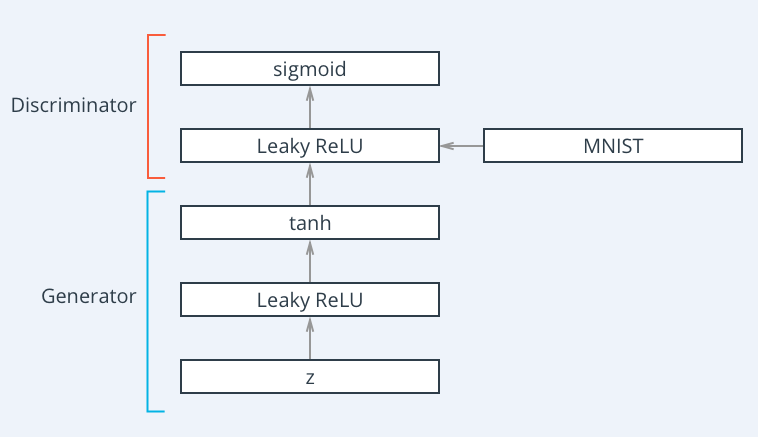


Here we'll build the generator network. To make this network a universal function approximator, we'll need at least one hidden layer. We should use a leaky ReLU to allow gradients to flow backwards through the layer unimpeded. A leaky ReLU is like a normal ReLU, except that there is a small non-zero output for negative input values.

#### Variable Scope
Here we need to use `tf.variable_scope` for two reasons. Firstly, we're going to make sure all the variable names start with `generator`. Similarly, we'll prepend `discriminator` to the discriminator variables. This will help out later when we're training the separate networks.

We could just use `tf.name_scope` to set the names, but we also want to reuse these networks with different inputs. For the generator, we're going to train it, but also _sample from it_ as we're training and after training. The discriminator will need to share variables between the fake and real input images. So, we can use the `reuse` keyword for `tf.variable_scope` to tell TensorFlow to reuse the variables instead of creating new ones if we build the graph again.

To use `tf.variable_scope`, you use a `with` statement:
```python
with tf.variable_scope('scope_name', reuse=False):
    # code here
```


#### Leaky ReLU
TensorFlow doesn't provide an operation for leaky ReLUs, so we'll need to make one . For this you can use take the outputs from a linear fully connected layer and pass them to `tf.maximum`. Typically, a parameter `alpha` sets the magnitude of the output for negative values. So, the output for negative input (`x`) values is `alpha*x`, and the output for positive `x` is `x`:
$$
f(x) = max(\alpha * x, x)
$$

#### Tanh Output
The generator has been found to perform the best with $tanh$ for the generator output. This means that we'll have to rescale the MNIST images to be between -1 and 1, instead of 0 and 1.

In [0]:
def generator(z, out_dim, n_units=128, reuse=False, alpha=0.01):
    with tf.variable_scope('generator', reuse=reuse):
        # Hidden layer
        h1 = tf.layers.dense(z, n_units, activation=None)
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        # Logits and tanh output
        logits = tf.layers.dense(h1, out_dim, activation=None)
        out = tf.tanh(logits)
        
        return out

## Discriminator

The discriminator network is almost exactly the same as the generator network, except that we're using a sigmoid output layer.

In [0]:
def discriminator(x, n_units=128, reuse=False, alpha=0.01):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Hidden layer
        h1 = tf.layers.dense(x, n_units, activation=None)
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        logits = tf.layers.dense(h1, 1, activation=None)
        out = tf.sigmoid(logits)
        
        return out, logits

## Hyperparameters

In [0]:
# Size of input image to discriminator
input_size = 784
# Size of latent vector to generator
z_size = 100
# Sizes of hidden layers in generator and discriminator
g_hidden_size = 128
d_hidden_size = 128
# Leak factor for leaky ReLU
alpha = 0.01
# Smoothing 
smooth = 0.1

## Build network

Now we're building the network from the functions defined above.

First is to get our inputs, `input_real, input_z` from `model_inputs` using the sizes of the input and z.

Then, we'll create the generator, `generator(input_z, input_size)`. This builds the generator with the appropriate input and output sizes.

Then the discriminators. We'll build two of them, one for real data and one for fake data. Since we want the weights to be the same for both real and fake data, we need to reuse the variables. For the fake data, we're getting it from the generator as `g_model`. So the real data discriminator is `discriminator(input_real)` while the fake discriminator is `discriminator(g_model, reuse=True)`.

In [0]:
tf.reset_default_graph()
# Create our input placeholders
input_real, input_z = model_inputs(input_size, z_size)

# Build the model
g_model = generator(input_z, input_size, n_units=g_hidden_size, alpha=alpha)
# g_model is the generator output

d_model_real, d_logits_real = discriminator(input_real, n_units=d_hidden_size, alpha=alpha)
d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, n_units=d_hidden_size, alpha=alpha)

## Discriminator and Generator Losses

Now we need to calculate the losses, which is a little tricky. For the discriminator, the total loss is the sum of the losses for real and fake images, `d_loss = d_loss_real + d_loss_fake`. The losses will by sigmoid cross-entropys, which we can get with `tf.nn.sigmoid_cross_entropy_with_logits`. We'll also wrap that in `tf.reduce_mean` to get the mean for all the images in the batch. So the losses will look something like 

```python
tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))
```

For the real image logits, we'll use `d_logits_real` which we got from the discriminator in the cell above. For the labels, we want them to be all ones, since these are all real images. To help the discriminator generalize better, the labels are reduced a bit from 1.0 to 0.9, for example,  using the parameter `smooth`. This is known as label smoothing, typically used with classifiers to improve performance. In TensorFlow, it looks something like `labels = tf.ones_like(tensor) * (1 - smooth)`

The discriminator loss for the fake data is similar. The logits are `d_logits_fake`, which we got from passing the generator output to the discriminator. These fake logits are used with labels of all zeros. Remember that we want the discriminator to output 1 for real images and 0 for fake images, so we need to set up the losses to reflect that.

Finally, the generator losses are using `d_logits_fake`, the fake image logits. But, now the labels are all ones. The generator is trying to fool the discriminator, so it wants the discriminator to output ones for fake images.

In [0]:
# Calculate losses
d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                          labels=tf.ones_like(d_logits_real) * (1 - smooth)))
d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                          labels=tf.zeros_like(d_logits_real)))
d_loss = d_loss_real + d_loss_fake

g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                     labels=tf.ones_like(d_logits_fake)))

## Optimizers

We want to update the generator and discriminator variables separately. So we need to get the variables for each part build optimizers for the two parts. To get all the trainable variables, we use `tf.trainable_variables()`. This creates a list of all the variables we've defined in our graph.

For the generator optimizer, we only want to generator variables. Our past selves were nice and used a variable scope to start all of our generator variable names with `generator`. So, we just need to iterate through the list from `tf.trainable_variables()` and keep variables to start with `generator`. Each variable object has an attribute `name` which holds the name of the variable as a string (`var.name == 'weights_0'` for instance). 

We can do something similar with the discriminator. All the variables in the discriminator start with `discriminator`.

Then, in the optimizer we pass the variable lists to `var_list` in the `minimize` method. This tells the optimizer to only update the listed variables. Something like `tf.train.AdamOptimizer().minimize(loss, var_list=var_list)` will only train the variables in `var_list`.

In [0]:
# Optimizers
learning_rate = 0.002

# Get the trainable_variables, split into G and D parts
t_vars = tf.trainable_variables()
g_vars = [var for var in t_vars if var.name.startswith('generator')]
d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

d_train_opt = tf.train.AdamOptimizer(learning_rate).minimize(d_loss, var_list=d_vars)
g_train_opt = tf.train.AdamOptimizer(learning_rate).minimize(g_loss, var_list=g_vars)

## Training

In [0]:
batch_size = 100
epochs = 100
samples = []
losses = []
# Only save generator variables
saver = tf.train.Saver(var_list=g_vars)
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for e in range(epochs):
        for ii in range(train_images.shape[0]//batch_size):
            #batch = mnist.train.next_batch(batch_size)
            batch = train_images[(batch_size*ii):(batch_size*(ii+1))]
            # Get images, reshape and rescale to pass to D
            batch_images = batch.reshape((batch_size, 784))
            batch_images = batch_images*2 - 1
            
            # Sample random noise for G
            batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            
            # Run optimizers
            _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
            _ = sess.run(g_train_opt, feed_dict={input_z: batch_z})
        
        # At the end of each epoch, get the losses and print them out
        train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
        train_loss_g = g_loss.eval({input_z: batch_z})
            
        print("Epoch {}/{}...".format(e+1, epochs),
              "Discriminator Loss: {:.4f}...".format(train_loss_d),
              "Generator Loss: {:.4f}".format(train_loss_g))    
        # Save losses to view after training
        losses.append((train_loss_d, train_loss_g))
        
        # Sample from generator as we're training for viewing afterwards
        sample_z = np.random.uniform(-1, 1, size=(16, z_size))
        gen_samples = sess.run(
                       generator(input_z, input_size, n_units=g_hidden_size, reuse=True, alpha=alpha),
                       feed_dict={input_z: sample_z})
        samples.append(gen_samples)
        saver.save(sess, './checkpoints/generator.ckpt')

# Save training generator samples
with open('train_samples.pkl', 'wb') as f:
    pkl.dump(samples, f)

Epoch 1/100... Discriminator Loss: 0.4031... Generator Loss: 3.5540
Epoch 2/100... Discriminator Loss: 0.5818... Generator Loss: 1.9870
Epoch 3/100... Discriminator Loss: 0.4607... Generator Loss: 2.7242
Epoch 4/100... Discriminator Loss: 0.6017... Generator Loss: 3.8944
Epoch 5/100... Discriminator Loss: 2.0965... Generator Loss: 6.6563
Epoch 6/100... Discriminator Loss: 1.4545... Generator Loss: 1.8625
Epoch 7/100... Discriminator Loss: 0.8988... Generator Loss: 2.0936
Epoch 8/100... Discriminator Loss: 2.3398... Generator Loss: 2.3135
Epoch 9/100... Discriminator Loss: 2.0584... Generator Loss: 1.8754
Epoch 10/100... Discriminator Loss: 1.4353... Generator Loss: 3.2542
Epoch 11/100... Discriminator Loss: 1.9276... Generator Loss: 2.0082
Epoch 12/100... Discriminator Loss: 2.7887... Generator Loss: 1.2809
Epoch 13/100... Discriminator Loss: 1.1616... Generator Loss: 1.9089
Epoch 14/100... Discriminator Loss: 0.9113... Generator Loss: 2.3629
Epoch 15/100... Discriminator Loss: 0.9111.

## Training loss

Here we'll check out the training losses for the generator and discriminator.

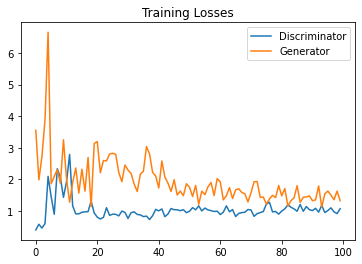

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

## Generator samples from training

Here we can view samples of images from the generator. First we'll look at images taken while training.

In [0]:
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(7,7), nrows=4, ncols=4, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((28,28)), cmap='Greys_r')
    
    return fig, axes

In [0]:
# Load samples from generator taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

These are samples from the final training epoch. You can see the generator is able to reproduce numbers like 1, 7, 3, 2. Since this is just a sample, it isn't representative of the full range of images this generator can make.

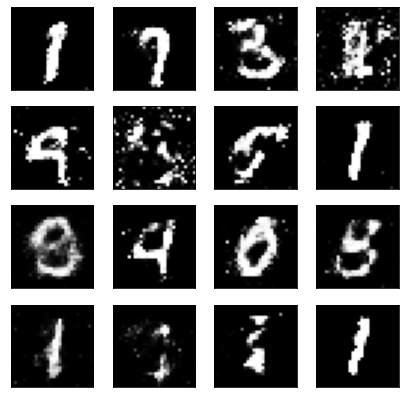

In [0]:
_ = view_samples(-1, samples)

Below I'm showing the generated images as the network was training, every 10 epochs. With bonus optical illusion!

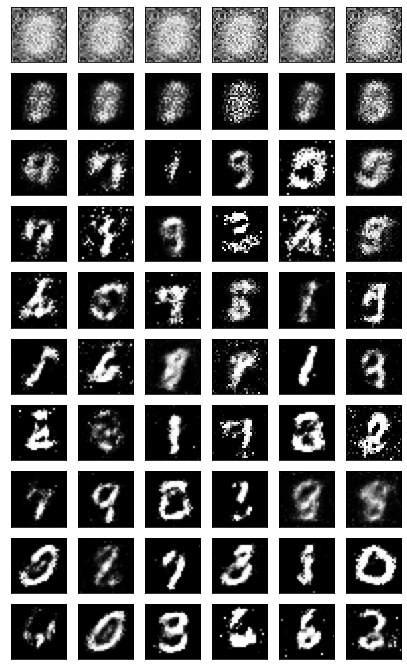

In [0]:
rows, cols = 10, 6
fig, axes = plt.subplots(figsize=(7,12), nrows=rows, ncols=cols, sharex=True, sharey=True)

for sample, ax_row in zip(samples[::int(len(samples)/rows)], axes):
    for img, ax in zip(sample[::int(len(sample)/cols)], ax_row):
        ax.imshow(img.reshape((28,28)), cmap='Greys_r')
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)

It starts out as all noise. Then it learns to make only the center white and the rest black. You can start to see some number like structures appear out of the noise like 1s and 9s.

## Sampling from the generator

We can also get completely new images from the generator by using the checkpoint we saved after training. We just need to pass in a new latent vector $z$ and we'll get new samples!

INFO:tensorflow:Restoring parameters from checkpoints/generator.ckpt


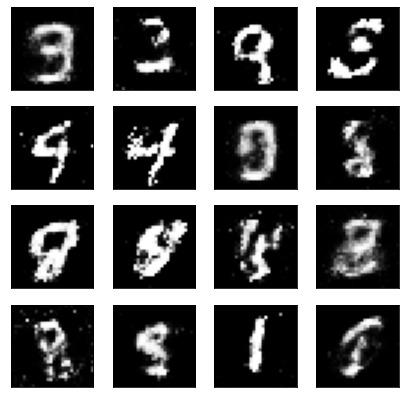

In [0]:
saver = tf.train.Saver(var_list=g_vars)
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checkpoints'))
    sample_z = np.random.uniform(-1, 1, size=(16, z_size))
    gen_samples = sess.run(
                   generator(input_z, input_size, n_units=g_hidden_size, reuse=True, alpha=alpha),
                   feed_dict={input_z: sample_z})
_ = view_samples(0, [gen_samples])

# Deep Convolutional GANs

Now, we'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. You can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![alt text](https://lh3.googleusercontent.com/proxy/dh3hORgyOhfjkJztVz9QclvnVRqoST1l58pTIv5GLeeaJuJ8wlK8WEf3TmZym7Vss0jnmCqGtSqUn_RbAduCMCdHWr2A6lkwIn0)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what you saw previously are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [0]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 

In [0]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [0]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:02, 74.0MB/s]                           
SVHN Testing Set: 64.3MB [00:04, 12.9MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [0]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [0]:
type(trainset)

dict

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

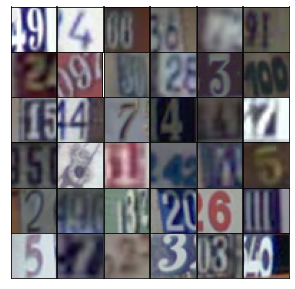

In [0]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [0]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [0]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [0]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here we build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![alt text](https://miro.medium.com/max/4124/1*KvMnRfb76DponICrHIbSdg.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [0]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here we build the discriminator. This is basically just a convolutional classifier like we've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers we start with 16, 32, 64 filters in the first layer, then double the depth as we add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [0]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [0]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [0]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined above to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [0]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        #tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [0]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [0]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Instructions for updating:
Use keras.layers.Dense instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.


Epoch 1/25... Discriminator Loss: 0.9549... Generator Loss: 1.5266
Epoch 1/25... Discriminator Loss: 0.5567... Generator Loss: 1.3967
Epoch 1/25... Discriminator Loss: 0.2534... Generator Loss: 1.9060
Epoch 1/25... Discriminator Loss: 0.1459... Generator Loss: 2.7002
Epoch 1/25... Discriminator Loss: 0.2040... Generator Loss: 2.4541
Epoch 1/25... Discriminator Loss: 0.1265... Generator Loss: 2.9401
Epoch 1/25... Discriminator Loss: 0.1460... Generator Loss: 2.7516
Epoch 1/25... Discriminator Loss: 0.1228... Generator Loss: 3.2933
Epoch 1/25... Discriminator Loss: 0.1253... Generator Loss: 2.8827
Epoch 1/25... Discriminator Loss: 0.3805... Generator Loss: 2.6545


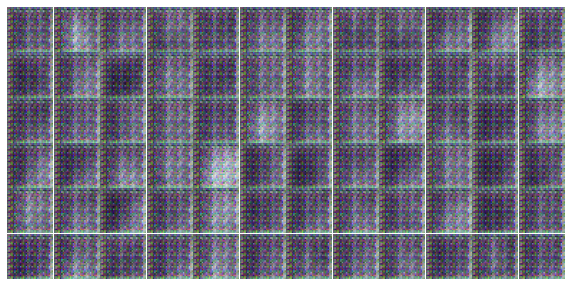

Epoch 1/25... Discriminator Loss: 0.8016... Generator Loss: 1.4975
Epoch 1/25... Discriminator Loss: 0.6663... Generator Loss: 1.8270
Epoch 1/25... Discriminator Loss: 0.8872... Generator Loss: 0.9248
Epoch 1/25... Discriminator Loss: 0.3964... Generator Loss: 2.3388
Epoch 1/25... Discriminator Loss: 1.0292... Generator Loss: 0.9378
Epoch 1/25... Discriminator Loss: 0.5092... Generator Loss: 2.1741
Epoch 1/25... Discriminator Loss: 0.3792... Generator Loss: 2.1398
Epoch 1/25... Discriminator Loss: 0.4526... Generator Loss: 1.9420
Epoch 1/25... Discriminator Loss: 0.4835... Generator Loss: 1.4182
Epoch 1/25... Discriminator Loss: 0.4572... Generator Loss: 1.4632


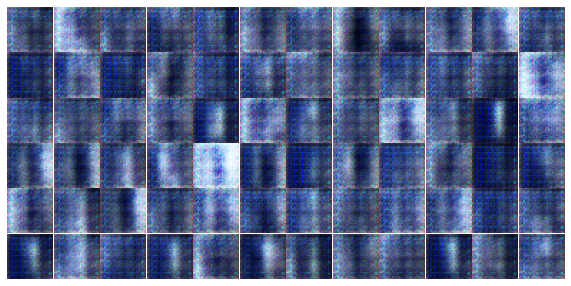

Epoch 1/25... Discriminator Loss: 0.2367... Generator Loss: 2.1130
Epoch 1/25... Discriminator Loss: 0.8269... Generator Loss: 0.8415
Epoch 1/25... Discriminator Loss: 0.6998... Generator Loss: 1.1582
Epoch 1/25... Discriminator Loss: 0.4816... Generator Loss: 1.6395
Epoch 1/25... Discriminator Loss: 0.8020... Generator Loss: 0.8967
Epoch 1/25... Discriminator Loss: 1.2922... Generator Loss: 5.7304
Epoch 1/25... Discriminator Loss: 1.6049... Generator Loss: 0.3201
Epoch 1/25... Discriminator Loss: 0.2609... Generator Loss: 3.3070
Epoch 1/25... Discriminator Loss: 0.1541... Generator Loss: 3.9291
Epoch 1/25... Discriminator Loss: 0.7017... Generator Loss: 1.2627


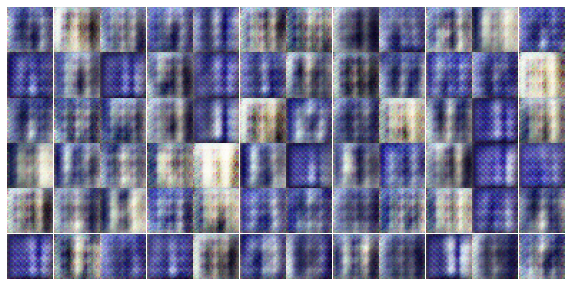

Epoch 1/25... Discriminator Loss: 0.2158... Generator Loss: 3.4265
Epoch 1/25... Discriminator Loss: 0.5566... Generator Loss: 1.2935
Epoch 1/25... Discriminator Loss: 0.8363... Generator Loss: 0.8398
Epoch 1/25... Discriminator Loss: 0.5013... Generator Loss: 2.3653
Epoch 1/25... Discriminator Loss: 0.6704... Generator Loss: 1.0075
Epoch 1/25... Discriminator Loss: 0.4716... Generator Loss: 1.3711
Epoch 1/25... Discriminator Loss: 0.4836... Generator Loss: 1.5879
Epoch 1/25... Discriminator Loss: 0.3288... Generator Loss: 3.0781
Epoch 1/25... Discriminator Loss: 0.6479... Generator Loss: 1.2763
Epoch 1/25... Discriminator Loss: 0.1617... Generator Loss: 2.9479


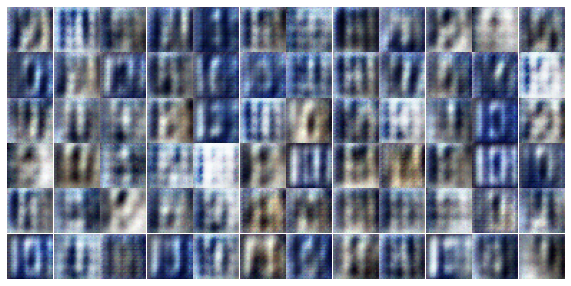

Epoch 1/25... Discriminator Loss: 0.4593... Generator Loss: 1.8993
Epoch 1/25... Discriminator Loss: 0.2201... Generator Loss: 2.7548
Epoch 1/25... Discriminator Loss: 0.2062... Generator Loss: 3.4287
Epoch 1/25... Discriminator Loss: 0.9833... Generator Loss: 2.1528
Epoch 1/25... Discriminator Loss: 0.5353... Generator Loss: 1.7212
Epoch 1/25... Discriminator Loss: 0.5722... Generator Loss: 1.8409
Epoch 1/25... Discriminator Loss: 0.9601... Generator Loss: 1.1556
Epoch 1/25... Discriminator Loss: 0.8859... Generator Loss: 0.9427
Epoch 1/25... Discriminator Loss: 1.2731... Generator Loss: 0.5748
Epoch 1/25... Discriminator Loss: 0.6807... Generator Loss: 1.3902


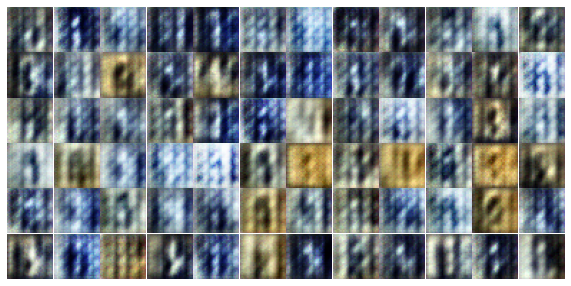

Epoch 1/25... Discriminator Loss: 0.6034... Generator Loss: 1.5664
Epoch 1/25... Discriminator Loss: 0.7574... Generator Loss: 1.1536
Epoch 1/25... Discriminator Loss: 0.6620... Generator Loss: 1.9901
Epoch 1/25... Discriminator Loss: 0.7784... Generator Loss: 1.2593
Epoch 1/25... Discriminator Loss: 0.5483... Generator Loss: 2.2920
Epoch 1/25... Discriminator Loss: 0.6924... Generator Loss: 1.3492
Epoch 1/25... Discriminator Loss: 0.6948... Generator Loss: 1.2417
Epoch 2/25... Discriminator Loss: 0.6905... Generator Loss: 1.6768
Epoch 2/25... Discriminator Loss: 0.8828... Generator Loss: 2.5761
Epoch 2/25... Discriminator Loss: 0.8829... Generator Loss: 0.9886


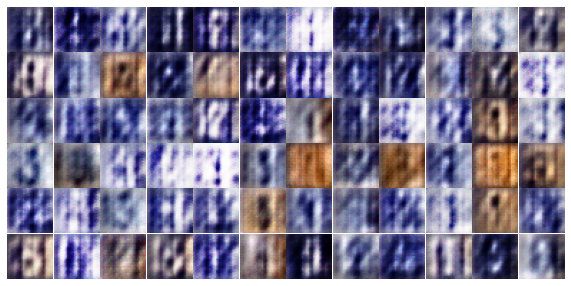

Epoch 2/25... Discriminator Loss: 0.5551... Generator Loss: 1.6751
Epoch 2/25... Discriminator Loss: 1.3403... Generator Loss: 0.5320
Epoch 2/25... Discriminator Loss: 0.6571... Generator Loss: 1.5816
Epoch 2/25... Discriminator Loss: 0.6492... Generator Loss: 1.6874
Epoch 2/25... Discriminator Loss: 1.2145... Generator Loss: 0.6229
Epoch 2/25... Discriminator Loss: 0.8018... Generator Loss: 1.2860
Epoch 2/25... Discriminator Loss: 1.1459... Generator Loss: 0.7452
Epoch 2/25... Discriminator Loss: 0.7994... Generator Loss: 1.6835
Epoch 2/25... Discriminator Loss: 0.9757... Generator Loss: 0.7655
Epoch 2/25... Discriminator Loss: 0.8886... Generator Loss: 1.7579


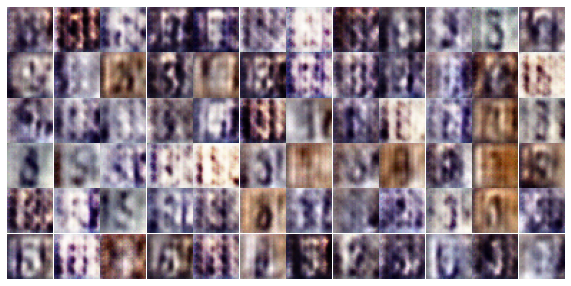

Epoch 2/25... Discriminator Loss: 0.8703... Generator Loss: 1.3109
Epoch 2/25... Discriminator Loss: 0.6180... Generator Loss: 1.7647
Epoch 2/25... Discriminator Loss: 0.5727... Generator Loss: 2.0082
Epoch 2/25... Discriminator Loss: 0.5956... Generator Loss: 1.9351
Epoch 2/25... Discriminator Loss: 0.8808... Generator Loss: 1.4814
Epoch 2/25... Discriminator Loss: 1.0858... Generator Loss: 1.6774
Epoch 2/25... Discriminator Loss: 0.9832... Generator Loss: 0.9835
Epoch 2/25... Discriminator Loss: 0.9236... Generator Loss: 1.0746
Epoch 2/25... Discriminator Loss: 0.9161... Generator Loss: 0.8437
Epoch 2/25... Discriminator Loss: 1.1784... Generator Loss: 0.6342


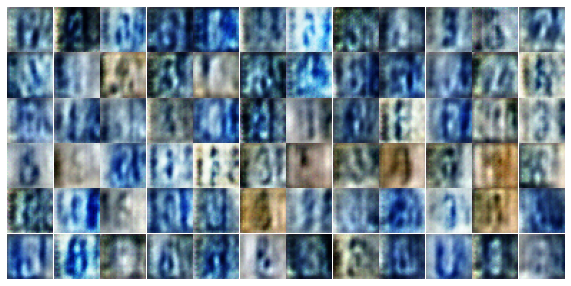

Epoch 2/25... Discriminator Loss: 1.0518... Generator Loss: 1.2177
Epoch 2/25... Discriminator Loss: 0.7695... Generator Loss: 1.5327
Epoch 2/25... Discriminator Loss: 0.7510... Generator Loss: 1.3336
Epoch 2/25... Discriminator Loss: 0.9461... Generator Loss: 1.8471
Epoch 2/25... Discriminator Loss: 0.9949... Generator Loss: 1.1326
Epoch 2/25... Discriminator Loss: 0.9363... Generator Loss: 1.6578
Epoch 2/25... Discriminator Loss: 1.5607... Generator Loss: 0.3636
Epoch 2/25... Discriminator Loss: 1.0354... Generator Loss: 0.8312
Epoch 2/25... Discriminator Loss: 1.1343... Generator Loss: 0.7574
Epoch 2/25... Discriminator Loss: 0.7416... Generator Loss: 1.3979


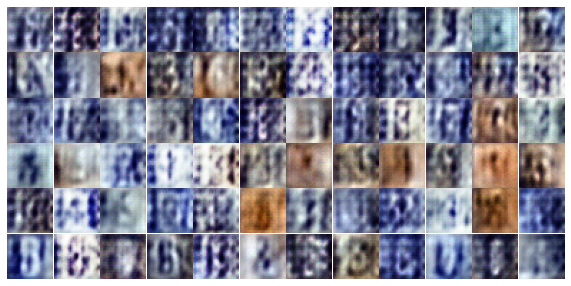

Epoch 2/25... Discriminator Loss: 0.8415... Generator Loss: 1.7971
Epoch 2/25... Discriminator Loss: 0.9788... Generator Loss: 1.0367
Epoch 2/25... Discriminator Loss: 1.1008... Generator Loss: 0.7507
Epoch 2/25... Discriminator Loss: 1.2734... Generator Loss: 0.6499
Epoch 2/25... Discriminator Loss: 0.7396... Generator Loss: 1.5881
Epoch 2/25... Discriminator Loss: 0.8991... Generator Loss: 1.2353
Epoch 2/25... Discriminator Loss: 0.9538... Generator Loss: 1.3170
Epoch 2/25... Discriminator Loss: 0.9910... Generator Loss: 1.5039
Epoch 2/25... Discriminator Loss: 0.9744... Generator Loss: 1.2018
Epoch 2/25... Discriminator Loss: 0.6468... Generator Loss: 1.9625


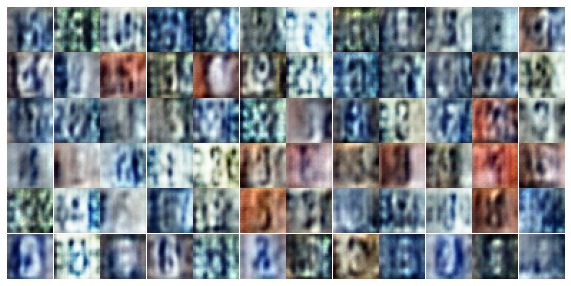

Epoch 2/25... Discriminator Loss: 0.8999... Generator Loss: 2.1455
Epoch 2/25... Discriminator Loss: 1.4888... Generator Loss: 1.4498
Epoch 2/25... Discriminator Loss: 1.3996... Generator Loss: 0.6971
Epoch 2/25... Discriminator Loss: 0.6537... Generator Loss: 1.8836
Epoch 2/25... Discriminator Loss: 1.0849... Generator Loss: 0.6464
Epoch 2/25... Discriminator Loss: 1.5363... Generator Loss: 0.3881
Epoch 2/25... Discriminator Loss: 0.6487... Generator Loss: 1.4211
Epoch 2/25... Discriminator Loss: 1.1277... Generator Loss: 0.9988
Epoch 2/25... Discriminator Loss: 0.6464... Generator Loss: 1.5935
Epoch 2/25... Discriminator Loss: 0.8262... Generator Loss: 1.4936


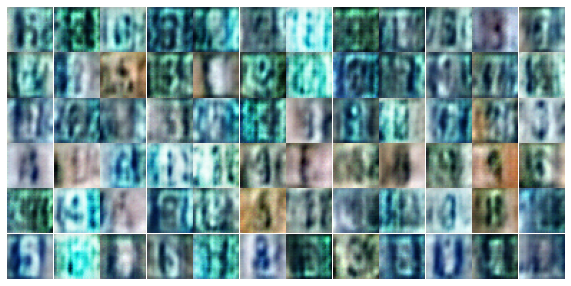

Epoch 2/25... Discriminator Loss: 0.7059... Generator Loss: 1.5052
Epoch 2/25... Discriminator Loss: 0.9581... Generator Loss: 1.2366
Epoch 2/25... Discriminator Loss: 1.3445... Generator Loss: 0.4731
Epoch 2/25... Discriminator Loss: 0.9877... Generator Loss: 1.1500
Epoch 3/25... Discriminator Loss: 1.1473... Generator Loss: 1.6439
Epoch 3/25... Discriminator Loss: 0.9267... Generator Loss: 1.1204
Epoch 3/25... Discriminator Loss: 0.6534... Generator Loss: 1.6474
Epoch 3/25... Discriminator Loss: 0.6788... Generator Loss: 1.3994
Epoch 3/25... Discriminator Loss: 1.4816... Generator Loss: 0.3834
Epoch 3/25... Discriminator Loss: 1.2658... Generator Loss: 0.5276


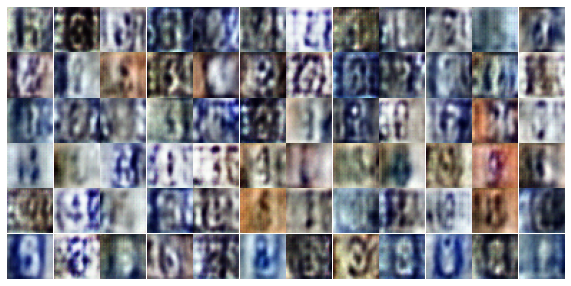

Epoch 3/25... Discriminator Loss: 1.0012... Generator Loss: 1.3959
Epoch 3/25... Discriminator Loss: 0.7037... Generator Loss: 1.5126
Epoch 3/25... Discriminator Loss: 0.8602... Generator Loss: 0.8422
Epoch 3/25... Discriminator Loss: 0.6722... Generator Loss: 1.1176
Epoch 3/25... Discriminator Loss: 0.6221... Generator Loss: 1.1578
Epoch 3/25... Discriminator Loss: 1.0105... Generator Loss: 1.2615
Epoch 3/25... Discriminator Loss: 1.0655... Generator Loss: 0.9558
Epoch 3/25... Discriminator Loss: 0.6436... Generator Loss: 1.6828
Epoch 3/25... Discriminator Loss: 1.1002... Generator Loss: 0.6726
Epoch 3/25... Discriminator Loss: 0.5898... Generator Loss: 1.1911


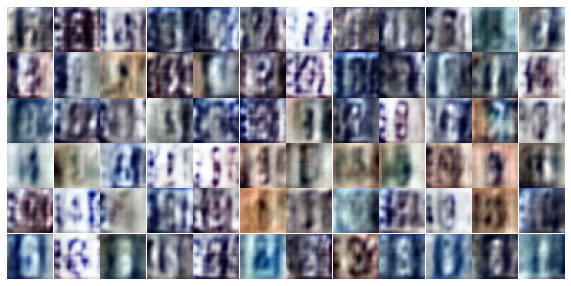

Epoch 3/25... Discriminator Loss: 0.5766... Generator Loss: 2.1794
Epoch 3/25... Discriminator Loss: 0.5382... Generator Loss: 1.5480
Epoch 3/25... Discriminator Loss: 0.9160... Generator Loss: 0.9645
Epoch 3/25... Discriminator Loss: 0.5806... Generator Loss: 1.2703
Epoch 3/25... Discriminator Loss: 0.6257... Generator Loss: 1.2350
Epoch 3/25... Discriminator Loss: 0.4852... Generator Loss: 1.4558
Epoch 3/25... Discriminator Loss: 1.4034... Generator Loss: 0.3760
Epoch 3/25... Discriminator Loss: 0.4519... Generator Loss: 2.0144
Epoch 3/25... Discriminator Loss: 0.5550... Generator Loss: 1.2880
Epoch 3/25... Discriminator Loss: 0.7612... Generator Loss: 1.0567


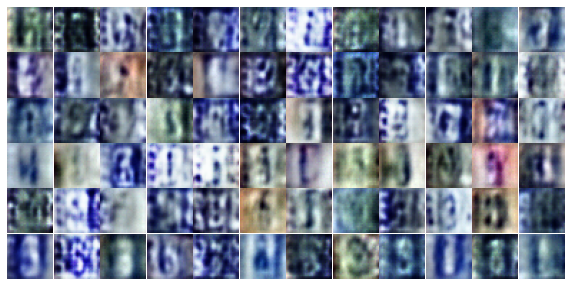

Epoch 3/25... Discriminator Loss: 0.8006... Generator Loss: 2.5021
Epoch 3/25... Discriminator Loss: 0.8405... Generator Loss: 1.8539
Epoch 3/25... Discriminator Loss: 0.7262... Generator Loss: 1.2642
Epoch 3/25... Discriminator Loss: 0.4191... Generator Loss: 1.4916
Epoch 3/25... Discriminator Loss: 0.4137... Generator Loss: 1.6907
Epoch 3/25... Discriminator Loss: 1.0237... Generator Loss: 0.6708
Epoch 3/25... Discriminator Loss: 0.8780... Generator Loss: 0.8617
Epoch 3/25... Discriminator Loss: 0.5466... Generator Loss: 1.4649
Epoch 3/25... Discriminator Loss: 0.4414... Generator Loss: 1.6039
Epoch 3/25... Discriminator Loss: 0.3766... Generator Loss: 1.9794


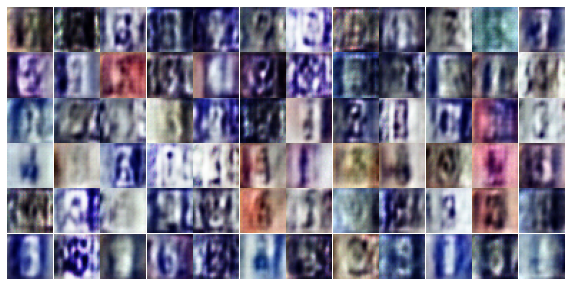

Epoch 3/25... Discriminator Loss: 0.3484... Generator Loss: 2.6098
Epoch 3/25... Discriminator Loss: 0.2745... Generator Loss: 2.1361
Epoch 3/25... Discriminator Loss: 0.2771... Generator Loss: 2.0976
Epoch 3/25... Discriminator Loss: 0.3476... Generator Loss: 1.8655
Epoch 3/25... Discriminator Loss: 0.2767... Generator Loss: 2.3322
Epoch 3/25... Discriminator Loss: 1.3080... Generator Loss: 0.5246
Epoch 3/25... Discriminator Loss: 0.4194... Generator Loss: 2.2699
Epoch 3/25... Discriminator Loss: 0.3209... Generator Loss: 2.0905
Epoch 3/25... Discriminator Loss: 1.6258... Generator Loss: 0.3067
Epoch 3/25... Discriminator Loss: 1.3110... Generator Loss: 3.0837


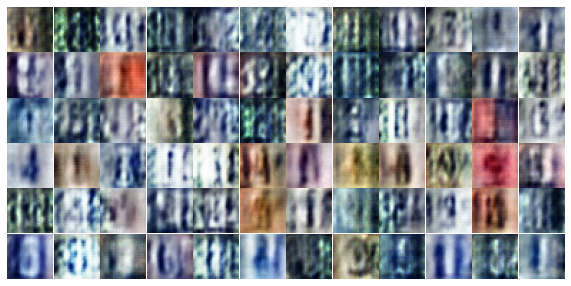

Epoch 3/25... Discriminator Loss: 0.8411... Generator Loss: 1.1091
Epoch 3/25... Discriminator Loss: 0.6266... Generator Loss: 1.4057
Epoch 3/25... Discriminator Loss: 1.2251... Generator Loss: 0.5541
Epoch 3/25... Discriminator Loss: 0.9423... Generator Loss: 1.6660
Epoch 3/25... Discriminator Loss: 0.5277... Generator Loss: 1.6560
Epoch 3/25... Discriminator Loss: 0.5454... Generator Loss: 1.8948
Epoch 3/25... Discriminator Loss: 0.3463... Generator Loss: 2.0391
Epoch 3/25... Discriminator Loss: 0.4511... Generator Loss: 2.0847
Epoch 3/25... Discriminator Loss: 0.3832... Generator Loss: 1.7243
Epoch 3/25... Discriminator Loss: 0.5223... Generator Loss: 1.3111


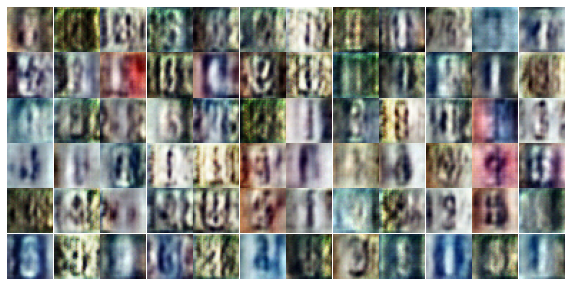

Epoch 3/25... Discriminator Loss: 0.6620... Generator Loss: 1.1131
Epoch 4/25... Discriminator Loss: 0.4593... Generator Loss: 2.0398
Epoch 4/25... Discriminator Loss: 0.5227... Generator Loss: 1.2992
Epoch 4/25... Discriminator Loss: 0.4396... Generator Loss: 1.4441
Epoch 4/25... Discriminator Loss: 0.6178... Generator Loss: 1.1035
Epoch 4/25... Discriminator Loss: 0.2685... Generator Loss: 2.1951
Epoch 4/25... Discriminator Loss: 0.2940... Generator Loss: 2.8762
Epoch 4/25... Discriminator Loss: 2.3833... Generator Loss: 0.2138
Epoch 4/25... Discriminator Loss: 0.7120... Generator Loss: 2.6999
Epoch 4/25... Discriminator Loss: 0.6017... Generator Loss: 1.1325


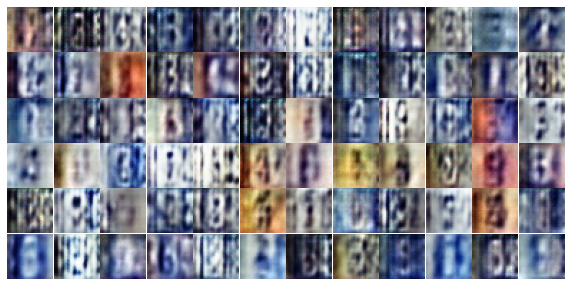

Epoch 4/25... Discriminator Loss: 0.7081... Generator Loss: 1.4373
Epoch 4/25... Discriminator Loss: 1.2203... Generator Loss: 0.8277
Epoch 4/25... Discriminator Loss: 0.6105... Generator Loss: 1.3643
Epoch 4/25... Discriminator Loss: 0.4327... Generator Loss: 1.7026
Epoch 4/25... Discriminator Loss: 0.5702... Generator Loss: 1.5943
Epoch 4/25... Discriminator Loss: 0.7525... Generator Loss: 1.0753
Epoch 4/25... Discriminator Loss: 0.7779... Generator Loss: 0.9654
Epoch 4/25... Discriminator Loss: 0.6283... Generator Loss: 1.1609
Epoch 4/25... Discriminator Loss: 0.4089... Generator Loss: 1.7847
Epoch 4/25... Discriminator Loss: 0.6354... Generator Loss: 2.4467


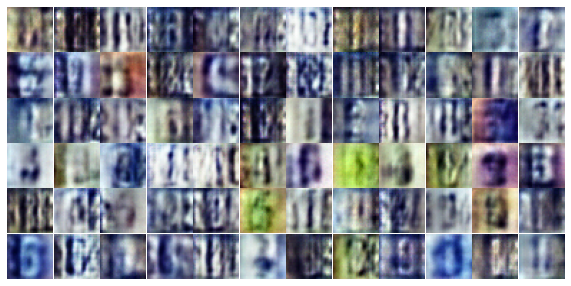

Epoch 4/25... Discriminator Loss: 0.5205... Generator Loss: 1.7384
Epoch 4/25... Discriminator Loss: 0.9450... Generator Loss: 2.8322
Epoch 4/25... Discriminator Loss: 0.9375... Generator Loss: 0.6938
Epoch 4/25... Discriminator Loss: 0.6798... Generator Loss: 1.1602
Epoch 4/25... Discriminator Loss: 0.7615... Generator Loss: 0.9439
Epoch 4/25... Discriminator Loss: 0.3671... Generator Loss: 1.6519
Epoch 4/25... Discriminator Loss: 0.3226... Generator Loss: 2.1960
Epoch 4/25... Discriminator Loss: 1.1850... Generator Loss: 0.5712
Epoch 4/25... Discriminator Loss: 0.4367... Generator Loss: 1.6227
Epoch 4/25... Discriminator Loss: 0.9384... Generator Loss: 3.8908


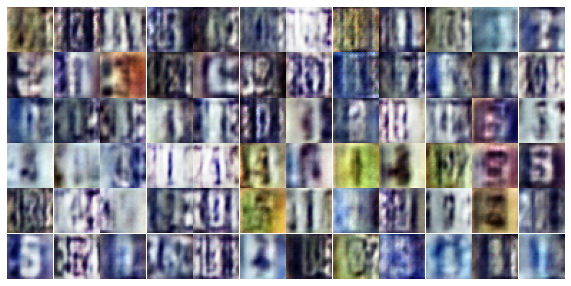

Epoch 4/25... Discriminator Loss: 0.5015... Generator Loss: 2.0470


In [0]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

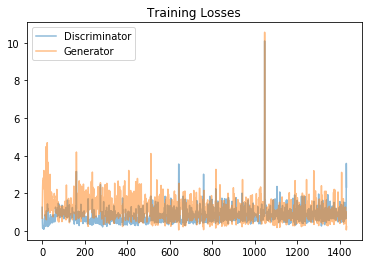

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

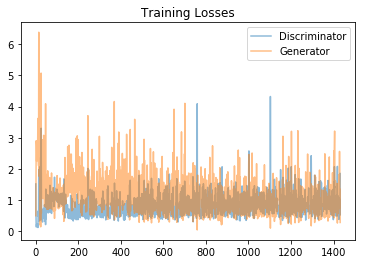

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

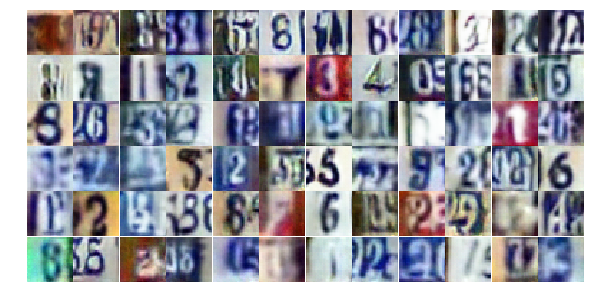

In [0]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

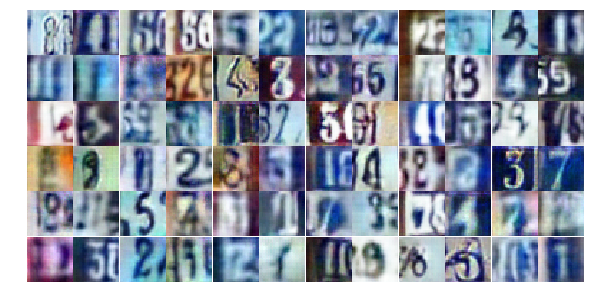

In [0]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))